In [62]:
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
import cv2

In [36]:
true_dir = "/kaggle/working/dataset_train/pseud_ashcolor_4label/labels/true"
pred_dir = "/kaggle/working/dataset_train/pseud_ashcolor_4label/labels/valid"
image_dir = "/kaggle/working/dataset_train/pseud_ashcolor_4label/images"

In [65]:
def show_segmentation_results(image, pred, true):
    kernel = np.ones((5,5),np.uint8)
    pred = cv2.dilate(pred,kernel,iterations = 1)
    tp = np.logical_and(pred, true)
    fp = np.logical_and(pred, np.logical_not(true))
    fn = np.logical_and(np.logical_not(pred), true)
    tn = np.logical_and(np.logical_not(pred), np.logical_not(true))

    fig, axs = plt.subplots(1, 4, figsize=(20, 10))
    axs.flatten()
    axs[0].imshow(image)
    axs[0].set_title('image')
    axs[1].imshow(tp, cmap="gray", vmin=0, vmax=1)
    axs[1].set_title('True Positive (TP)')
    axs[2].imshow(fp, cmap='gray', vmin=0, vmax=1)
    axs[2].set_title('False Positive (FP)')
    axs[3].imshow(fn, cmap='gray', vmin=0, vmax=1)
    axs[3].set_title('False Negative (FN)')
    # axs[4].imshow(tn, cmap='Greys', vmin=0, vmax=1)
    # axs[4].set_title('True Negative (TN)')
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')
    axs[3].axis('off')
    # axs[4].axis('off')

    plt.tight_layout()
    plt.show()


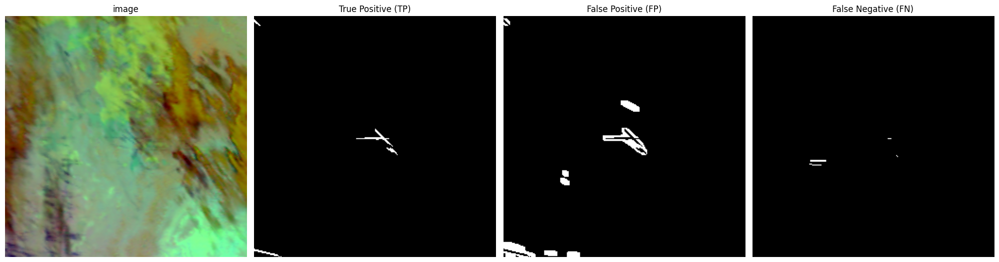

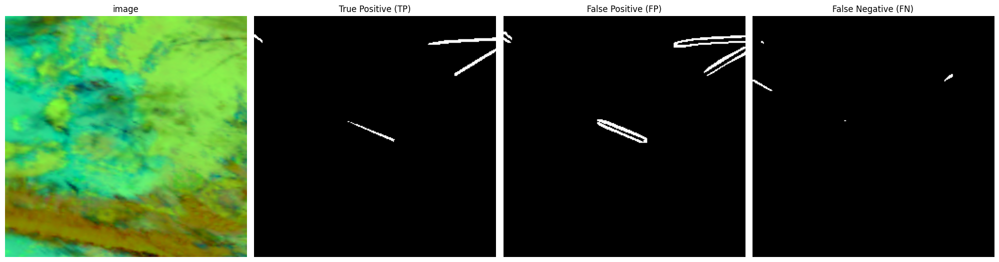

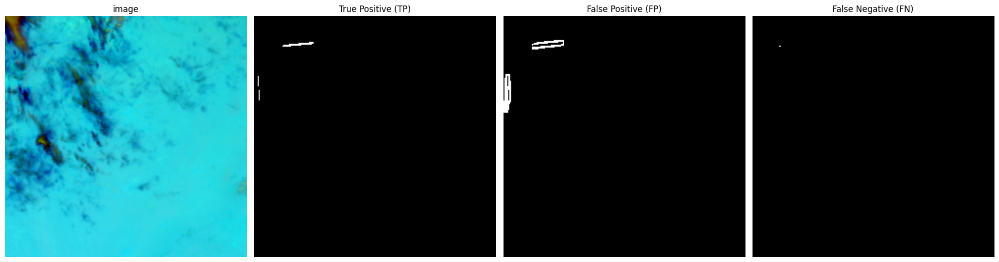

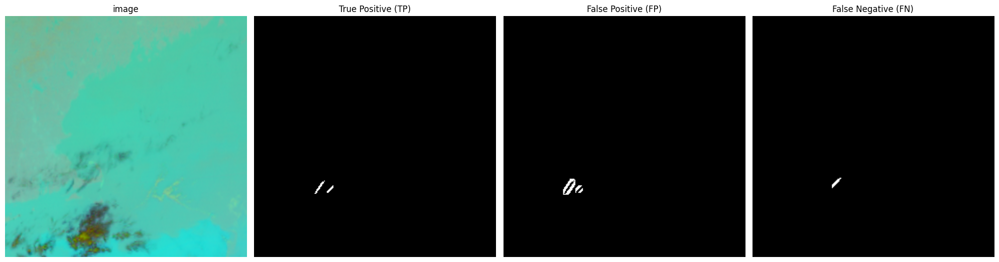

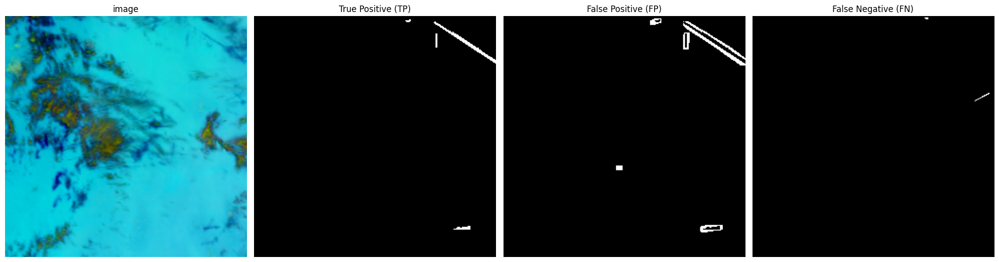

...

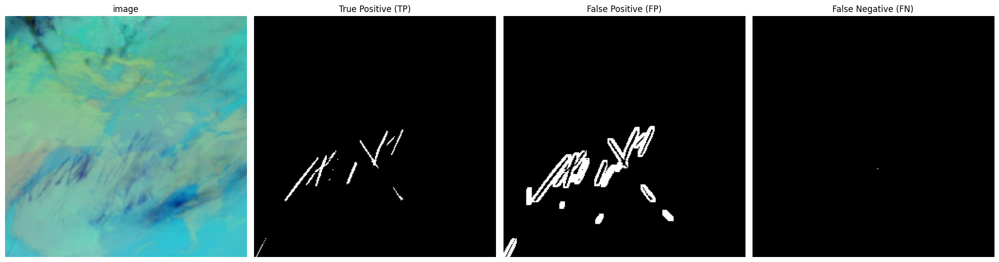

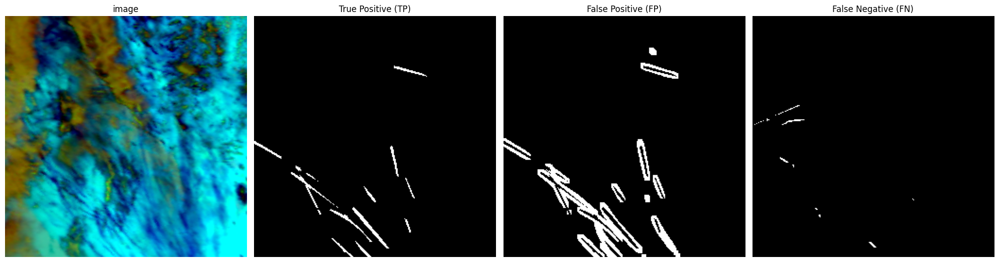

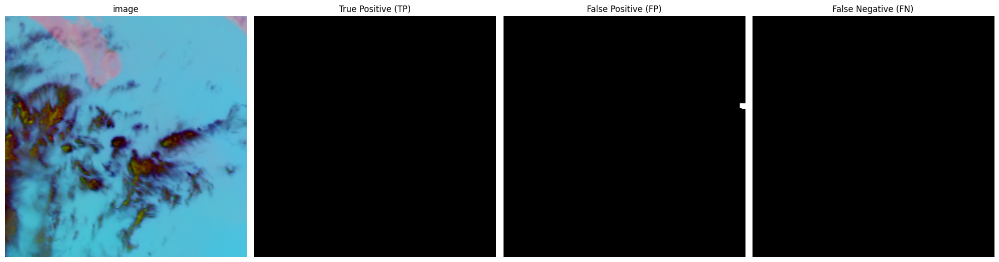

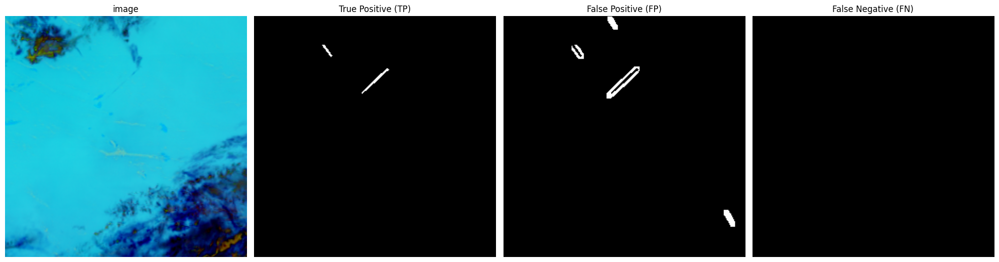

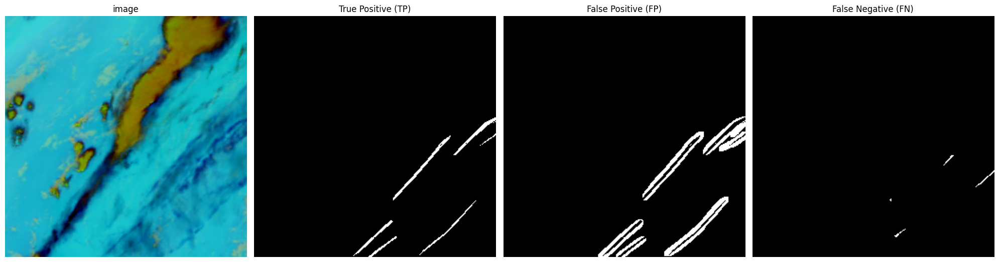

In [67]:
no=200

for i in range(no,no+100):
    npy_fname=os.listdir(pred_dir)[i]
    npy_true=np.load(os.path.join(true_dir,npy_fname)).astype(np.float32)[...,2]
    npy_pred=np.load(os.path.join(pred_dir,npy_fname)).astype(np.float32)[...,2]
    npy_image=np.load(os.path.join(image_dir,npy_fname)).astype(np.float32)
    if npy_pred.sum()==0:continue
    show_segmentation_results(npy_image, npy_pred, npy_true)